<a href="https://colab.research.google.com/github/alvinoer/Sentiment-Analysis-Adidas-Running-App-Reviews/blob/main/Week2_Scrapping_Apps_Review_Adidas_Runnin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Scrapping Google Apps Review - eg Adidas Running
Week 2 NLP Pipeline PBA/ Genap 2025/ Irmasari Hafidz irma@its.ac.id

In [1]:
!pip install google_play_scraper
!pip install textblob
!pip install seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.1 MB/s eta 0:00:00


In [2]:
from google_play_scraper import app
import pandas as pd
import numpy as np
import sklearn
import requests
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns
import textblob
#from wordcloud import WordCloud
from pathlib import Path
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score

import pickle
import re
import time
import datetime                              # access to %%time, for timing individual notebook cells
import os
from PIL import Image
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

%matplotlib inline
%config InlineBackend.figure_format='retina'

# Import seaborn styles explicitly
import seaborn as sns
# Apply the seaborn style before creating plots
sns.set_style("whitegrid")  # This line sets the Seaborn style

plt.rcParams["figure.figsize"] = (12,8)

# **Scrapping App Reviews**

In [3]:
#Android App Adidas Running from Google Play at
#https://play.google.com/store/apps/details?id=com.runtastic.android&pcampaignid=web_share
#The apps ID found in the link after id=com.runtastic.android
#The apps name on Google Play titled: adidas Running: Run Tracker
#Dated 6 March 2025 and N of reviews 1.57M

from google_play_scraper import app, Sort, reviews_all

adidas_reviews = reviews_all(
    'com.runtastic.android',
    sleep_milliseconds=0, # defaults to 0
    lang='en', # defaults to 'en'
    sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

In [4]:
#Save Adidas Running reviews into dataframe
df_adidasrev = pd.DataFrame(np.array(adidas_reviews),columns=['content'])
df_adidasrev = df_adidasrev.join(pd.DataFrame(df_adidasrev.pop('content').tolist()))

#Save Adidas Running reviews into df_adidasrev.csv file
df_adidasrev.to_csv(r'df_adidasrev.csv', index=False)

In [5]:
df_adidasrev

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,6d6580c1-d327-4560-a0a7-4cee886c05aa,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,useful app,5,0,13.50,2025-04-03 01:41:37,None,NaT,13.50
1,37223078-3024-4ac8-9702-3be10297681f,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,"I'm trying to pay for full access for a year, ...",3,0,13.50,2025-04-02 19:49:14,None,NaT,13.50
2,4967a890-48ff-4991-be77-8c274c138aae,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Great app,4,0,5.5.4,2025-04-01 19:28:41,None,NaT,5.5.4
3,8064f569-73a8-4fd1-b9f1-f1372609d382,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,genuinely good application to track your progress,5,0,13.50,2025-04-01 14:05:06,None,NaT,13.50
4,337b4dec-c8d5-4b47-88a4-062fad27a74c,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,good,5,0,13.50,2025-04-01 10:10:20,None,NaT,13.50
...,...,...,...,...,...,...,...,...,...,...,...
52909,7523499d-4518-48ed-a18b-d4449375a5c8,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Works great on htc incredible,5,1,1.0,2010-05-14 23:11:53,None,NaT,1.0
52910,430ad291-5a7f-43af-b798-7817bc10845b,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Force close never would open on my HTC droid,1,1,1.0,2010-05-14 19:32:44,None,NaT,1.0
52911,342022c9-7f10-4409-9bf4-3222375a5f8d,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Fc on hero,1,0,1.0,2010-05-13 12:13:36,None,NaT,1.0
52912,55a70c79-cc52-4e28-a17c-cc7dead5cb3a,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Force closes at start up on motorola Dext (Cliq),1,1,1.0,2010-05-13 06:13:33,None,NaT,1.0


In [6]:
df_adidasrev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52914 entries, 0 to 52913
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   reviewId              52914 non-null  object        
 1   userName              52914 non-null  object        
 2   userImage             52914 non-null  object        
 3   content               52683 non-null  object        
 4   score                 52914 non-null  int64         
 5   thumbsUpCount         52914 non-null  int64         
 6   reviewCreatedVersion  46524 non-null  object        
 7   at                    52914 non-null  datetime64[ns]
 8   replyContent          4591 non-null   object        
 9   repliedAt             4591 non-null   datetime64[ns]
 10  appVersion            46524 non-null  object        
dtypes: datetime64[ns](2), int64(2), object(7)
memory usage: 4.4+ MB


#**Cleaning Dataset**

In [7]:
# 🔴 Menghapus kolom yang tidak diperlukan (reviewId, userName, userImage)
df_adidasrev.drop(columns=['reviewId', 'userName', 'userImage', "replyContent", "repliedAt"], inplace=True)

# 🟢 Menambahkan kolom ID dengan auto increment (dimulai dari 1)
df_adidasrev.insert(0, 'id', range(1, len(df_adidasrev) + 1))

In [8]:
# Menghapus review yang bernilai kosong
df_adidasrev = df_adidasrev[df_adidasrev['content'] != '']
# Memeriksa apakah masih ada review kosong pada kolom 'content' atau tidak
df_adidasrev[df_adidasrev['content'] == '']

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion


In [9]:
# Menghapus score yang bernilai kosong
df_adidasrev = df_adidasrev[df_adidasrev['score'] != 0]
# Memeriksa apakah masih ada review kosong pada kolom 'score' atau tidak
df_adidasrev[df_adidasrev['score'] == 0]

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion


In [10]:
df_adidasrev.info()

<class 'pandas.core.frame.DataFrame'>
Index: 52912 entries, 0 to 52913
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    52912 non-null  int64         
 1   content               52681 non-null  object        
 2   score                 52912 non-null  int64         
 3   thumbsUpCount         52912 non-null  int64         
 4   reviewCreatedVersion  46522 non-null  object        
 5   at                    52912 non-null  datetime64[ns]
 6   appVersion            46522 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 3.2+ MB


## Remove non en reviews

In [11]:
!pip install langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993223 sha256=efcd84a5b3b2785c2c47421cff12499e4c7bc9dca54ec2bd8360b4358ba3298f
  Stored in directory: /root/.cache/pip/wheels/0a/f2/b2/e5ca405801e05eb7c8ed5b3b4bcf1fcabcd6272c167640072e
Successfully built langdetect


In [12]:
from langdetect import detect, LangDetectException # Import LangDetectException

def detect_language(text):
    # Check if text is a string and not None
    if isinstance(text, str) and text is not None:
        try:
            return detect(text)
        except LangDetectException:
            return 'unknown'  # Or any other value to indicate an error
    # Handle cases where text is not a valid string (e.g., None)
    return 'unknown'

df_adidasrev = df_adidasrev[df_adidasrev['content'].apply(detect_language) == 'en']

In [13]:
# prompt: tampilkan jumlah bahasa yang terdetect dan berapa row yang termasuk bahasa tersebut

from collections import Counter

def detect_language(text):
    try:
        return detect(text)
    except LangDetectException:
        return 'unknown'

# Assuming df_adidasrev is already defined as in your provided code
# If not, load your dataframe here:
# df_adidasrev = pd.read_csv('/content/drive/My Drive/PBA/Review App Glory Fit.csv')

# Detect languages for each review
df_adidasrev['language'] = df_adidasrev['content'].apply(detect_language)

# Count language occurrences and create a new dataframe
language_counts = Counter(df_adidasrev['language'])
language_df = pd.DataFrame.from_dict(language_counts, orient='index', columns=['count'])
language_df.index.name = 'language'
language_df = language_df.sort_values(by=['count'], ascending=False).reset_index()

language_df


,language,count
0,en,37165
1,sl,116
2,af,86
3,no,61
4,ro,35
5,cy,33
6,it,33
7,fr,19
8,tl,17
9,so,13


In [14]:
df_adidasrev = df_adidasrev[df_adidasrev['language'] == 'en']


In [15]:
df_adidasrev.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37165 entries, 1 to 52913
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    37165 non-null  int64         
 1   content               37165 non-null  object        
 2   score                 37165 non-null  int64         
 3   thumbsUpCount         37165 non-null  int64         
 4   reviewCreatedVersion  33073 non-null  object        
 5   at                    37165 non-null  datetime64[ns]
 6   appVersion            33073 non-null  object        
 7   language              37165 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(4)
memory usage: 2.6+ MB


In [16]:
df_adidasrev = df_adidasrev.drop(columns =["language"])

#**Sentimen Analisis Sebelum Preprocessing**

In [17]:
#Creating polarity on the column: content (review from the apps) using TextBlob
#Read https://textblob.readthedocs.io/en/dev/quickstart.html

from textblob import TextBlob
# Handle None values in 'content' column by replacing them with empty strings
df_adidasrev['sentiment_polarity'] = df_adidasrev['content'].astype(str).apply(lambda x: TextBlob(x).polarity)
df_adidasrev['sentiment_subjective'] = df_adidasrev['content'].astype(str).apply(lambda x: TextBlob(x).subjectivity)

In [18]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_adidasrev['sentiment_rating'] = df_adidasrev['score'].apply(lambda x: 'Positive' if x > 3 else('Neutral' if x == 3  else 'Negative'))

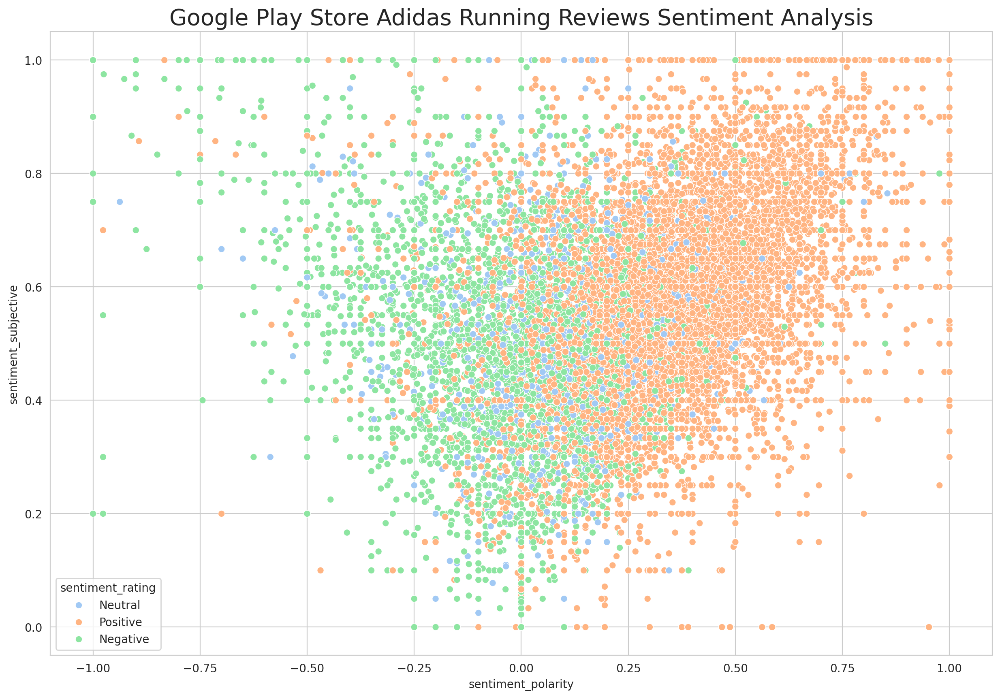

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 10))
# Specify x and y using the 'x' and 'y' parameters within sns.scatterplot
sns.scatterplot(x=df_adidasrev['sentiment_polarity'], y=df_adidasrev['sentiment_subjective'],
                hue=df_adidasrev['sentiment_rating'], edgecolor='white', palette="pastel")
plt.title("Google Play Store Adidas Running Reviews Sentiment Analysis", fontsize=20)
plt.show()

# **Preprocessing Data**

In [20]:
!pip install emoji

import numpy as np
import pandas as pd
pd.set_option("display.max_colwidth", 200)
#from pandas_profiling import ProfileReport
import regex
import nltk
import wordcloud
import textblob

from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob

import string
import re
import emoji

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 kB 6.2 MB/s eta 0:00:00


## **Lowercasing**

In [22]:
#DATA PREPROCESSING
# Lower casing
# Change the reviews type to string
df_adidasrev['content'] = df_adidasrev['content'].astype(str)# Before lowercasing
# Before lowercasing
df_adidasrev.head()

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiment_polarity,sentiment_subjective,sentiment_rating
1,2,"I'm trying to pay for full access for a year, but it doesn't work",3,0,13.50,2025-04-02 19:49:14,13.50,0.35,0.55,Neutral
2,3,Great app,4,0,5.5.4,2025-04-01 19:28:41,5.5.4,0.80,0.75,Positive
3,4,genuinely good application to track your progress,5,0,13.50,2025-04-01 14:05:06,13.50,0.70,0.60,Positive
5,6,"I enjoy hiking, and it's great that I can get free points to turn in coupons for a great brand. The Garmin comparability makes it even easier.",5,0,13.50,2025-03-31 12:55:35,13.50,0.60,0.70,Positive
6,7,too early yet,2,0,13.50,2025-03-31 10:36:08,13.50,0.10,0.30,Negative


In [23]:
#Lowercase all reviews to see the difference
df_adidasrev['content']= df_adidasrev['content'].apply(lambda x: x.lower())
df_adidasrev.head()

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiment_polarity,sentiment_subjective,sentiment_rating
1,2,"i'm trying to pay for full access for a year, but it doesn't work",3,0,13.50,2025-04-02 19:49:14,13.50,0.35,0.55,Neutral
2,3,great app,4,0,5.5.4,2025-04-01 19:28:41,5.5.4,0.80,0.75,Positive
3,4,genuinely good application to track your progress,5,0,13.50,2025-04-01 14:05:06,13.50,0.70,0.60,Positive
5,6,"i enjoy hiking, and it's great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.",5,0,13.50,2025-03-31 12:55:35,13.50,0.60,0.70,Positive
6,7,too early yet,2,0,13.50,2025-03-31 10:36:08,13.50,0.10,0.30,Negative


##**Menghapus Emoji dan Karakter Spesial**

In [24]:
#check if there is any special character
alphabet = string.ascii_letters+string.punctuation
print(df_adidasrev.content.str.strip(alphabet).astype(bool).any())

extracted_emojis=[]

def extract_emojis(s):
    expe = re.compile('[\U00010000-\U0010ffff]', flags=re.UNICODE)
    return expe.findall(s)
    return expe.sub(r'',s)

for y in df_adidasrev['content']:
    #print(str(extract_emojis(y)))
    extracted_emojis.append(str(extract_emojis(y)))

print(extracted_emojis)

True
['[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', "['🇨', '🇴', '🇨', '🇴', '🇨', '🇴']", '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', "['😢']", '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', "['🇬', '🇭']", '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', "['😍']", '[]', "['👌', '🏽']", '[]', '[]', '[]', '[]', "['👍']", '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', "['😳']", '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', "['😀']", "['😠']", '[]', '[]', '[]', '[]', "['😄']", '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', '[]', "['😞']", '[]', '[]', "['😡']", '[]', '[]', '[]', '[]', '[]', "['💀', '💀', '😭']", '[]', '[]', '[]', '[]', '[]', "['👍']", "['😊']", '[]', '[]', '[]', "['🧐', '🧐', '🧐']", '[]

In [25]:
# Fungsi untuk menghapus emoji dari teks
def remove_emojis(text):
    emoji_pattern = re.compile(
        "["
        u"\U0001F600-\U0001F64F"  # Emoticons
        u"\U0001F300-\U0001F5FF"  # Simbol & Piktograf
        u"\U0001F680-\U0001F6FF"  # Simbol Transportasi & Peta
        u"\U0001F1E0-\U0001F1FF"  # Bendera (iOS)
        u"\U00002500-\U00002BEF"  # Karakter Cina
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"  # Simbol Unicode tambahan
        u"\u2640-\u2642"  # Simbol Gender
        u"\u2600-\u2B55"  # Simbol Lainnya
        u"\u200d"  # Zero Width Joiner
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # Dingbats
        u"\u3030"
        "]+", flags=re.UNICODE
    )
    return emoji_pattern.sub(r'', text) if isinstance(text, str) else text  # Hanya proses jika teks

# Terapkan fungsi remove_emojis ke kolom 'content'
df_adidasrev['content'] = df_adidasrev['content'].astype(str).apply(remove_emojis)

In [26]:
# df_adidasrev['content'] = df_adidasrev['content'].apply(cleaning_text)

In [27]:
df_adidasrev.head()

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiment_polarity,sentiment_subjective,sentiment_rating
1,2,"i'm trying to pay for full access for a year, but it doesn't work",3,0,13.50,2025-04-02 19:49:14,13.50,0.35,0.55,Neutral
2,3,great app,4,0,5.5.4,2025-04-01 19:28:41,5.5.4,0.80,0.75,Positive
3,4,genuinely good application to track your progress,5,0,13.50,2025-04-01 14:05:06,13.50,0.70,0.60,Positive
5,6,"i enjoy hiking, and it's great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.",5,0,13.50,2025-03-31 12:55:35,13.50,0.60,0.70,Positive
6,7,too early yet,2,0,13.50,2025-03-31 10:36:08,13.50,0.10,0.30,Negative


##**Expand Contractions**

In [28]:
!pip install contractions
import spacy
import contractions

def expand_contractions(text):
    # Add a check to avoid processing empty strings or null values
    if isinstance(text, str) and len(text) > 0:
        try:  # Try to fix contractions
            return contractions.fix(text)
        except IndexError:  # Handle IndexError gracefully
            return text  # Return the original text if IndexError occurs
    return text

# Terapkan ekspansi kontraksi
df_adidasrev['expanded_content'] = df_adidasrev['content'].apply(expand_contractions)

# Tampilkan hasil
display(df_adidasrev[['content', 'expanded_content']])

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.3/118.3 kB 10.0 MB/s eta 0:00:00


,content,expanded_content
1,"i'm trying to pay for full access for a year, but it doesn't work","i am trying to pay for full access for a year, but it does not work"
2,great app,great app
3,genuinely good application to track your progress,genuinely good application to track your progress
5,"i enjoy hiking, and it's great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.","i enjoy hiking, and it is great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier."
6,too early yet,too early yet
...,...,...
52909,works great on htc incredible,works great on htc incredible
52910,force close never would open on my htc droid,force close never would open on my htc droid
52911,fc on hero,fc on hero
52912,force closes at start up on motorola dext (cliq),force closes at start up on motorola dext (cliq)


##**Tokenization**

In [29]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt_tab')
df_adidasrev['token'] = df_adidasrev['expanded_content'].apply(word_tokenize)

# Display the DataFrame with the tokens
display(df_adidasrev[['expanded_content', 'token']])

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


,expanded_content,token
1,"i am trying to pay for full access for a year, but it does not work","[i, am, trying, to, pay, for, full, access, for, a, year, ,, but, it, does, not, work]"
2,great app,"[great, app]"
3,genuinely good application to track your progress,"[genuinely, good, application, to, track, your, progress]"
5,"i enjoy hiking, and it is great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.","[i, enjoy, hiking, ,, and, it, is, great, that, i, can, get, free, points, to, turn, in, coupons, for, a, great, brand, ., the, garmin, comparability, makes, it, even, easier, .]"
6,too early yet,"[too, early, yet]"
...,...,...
52909,works great on htc incredible,"[works, great, on, htc, incredible]"
52910,force close never would open on my htc droid,"[force, close, never, would, open, on, my, htc, droid]"
52911,fc on hero,"[fc, on, hero]"
52912,force closes at start up on motorola dext (cliq),"[force, closes, at, start, up, on, motorola, dext, (, cliq, )]"


##**Punctuation Removal**

In [30]:
import re
import string

def cleaning_text(text):
    # Menambah spasi setelah koma jika tidak ada spasi
    text = re.sub(r",(?!\s)", ", ", text)
    # Menghapus tab, newline, backslash
    text = text.replace('\\t', " ").replace('\\n', " ").replace('\\u', " ").replace('\\', "")
    # Menghapus karakter non-ASCII (emoticon, huruf Cina, dll.)
    text = text.encode('ascii', 'replace').decode('ascii')
    # Menghapus URL
    text = re.sub(r"(?i)(?:https?:\/\/)?(?:www\.)?(?:[a-zA-Z0-9-.]+)(?:\.[a-zA-Z]{2,6})(?:\/[^\s\r\n]*)?", "", text)
    # Menghapus angka
    text = re.sub(r"\d+", "", text)
    # Menghapus tanda baca
    text = text.translate(str.maketrans("", "", string.punctuation))
    # Menghapus whitespace berlebih dan karakter tunggal
    text = text.strip()
    text = re.sub('\s+', ' ', text)
    return re.sub(r"\b[a-zA-Z]\b", "", text)

# Terapkan fungsi pembersihan ke kolom expanded_content
df_adidasrev['cleaned_content'] = df_adidasrev['expanded_content'].astype(str).apply(cleaning_text)

# Tokenisasi setelah kontraksi diperluas
df_adidasrev['token'] = df_adidasrev['cleaned_content'].apply(word_tokenize)


In [31]:
df_adidasrev.head()

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiment_polarity,sentiment_subjective,sentiment_rating,expanded_content,token,cleaned_content
1,2,"i'm trying to pay for full access for a year, but it doesn't work",3,0,13.50,2025-04-02 19:49:14,13.50,0.35,0.55,Neutral,"i am trying to pay for full access for a year, but it does not work","[am, trying, to, pay, for, full, access, for, year, but, it, does, not, work]",am trying to pay for full access for year but it does not work
2,3,great app,4,0,5.5.4,2025-04-01 19:28:41,5.5.4,0.80,0.75,Positive,great app,"[great, app]",great app
3,4,genuinely good application to track your progress,5,0,13.50,2025-04-01 14:05:06,13.50,0.70,0.60,Positive,genuinely good application to track your progress,"[genuinely, good, application, to, track, your, progress]",genuinely good application to track your progress
5,6,"i enjoy hiking, and it's great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.",5,0,13.50,2025-03-31 12:55:35,13.50,0.60,0.70,Positive,"i enjoy hiking, and it is great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.","[enjoy, hiking, and, it, is, great, that, can, get, free, points, to, turn, in, coupons, for, great, brand, the, garmin, comparability, makes, it, even, easier]",enjoy hiking and it is great that can get free points to turn in coupons for great brand the garmin comparability makes it even easier
6,7,too early yet,2,0,13.50,2025-03-31 10:36:08,13.50,0.10,0.30,Negative,too early yet,"[too, early, yet]",too early yet


##**Spelling Correction**

##**Before Stop Words Removal**

In [32]:
from collections import Counter

def freq_words(x, terms=30):
    all_words = ' '.join([text for text in x])
    all_words = all_words.split()

    # Count word frequency using Counter (faster than FreqDist)
    word_counts = Counter(all_words)
    words_df = pd.DataFrame(word_counts.items(), columns=['word', 'count'])

    # Select top 'terms' most frequent words
    d = words_df.nlargest(columns="count", n=terms)

    plt.figure(figsize=(20,5))
    ax = sns.barplot(data=d, x="word", y="count", palette="rainbow")
    ax.set(ylabel='Count')
    plt.show()


<ipython-input-32-b9ff2e5d559c>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette="rainbow")


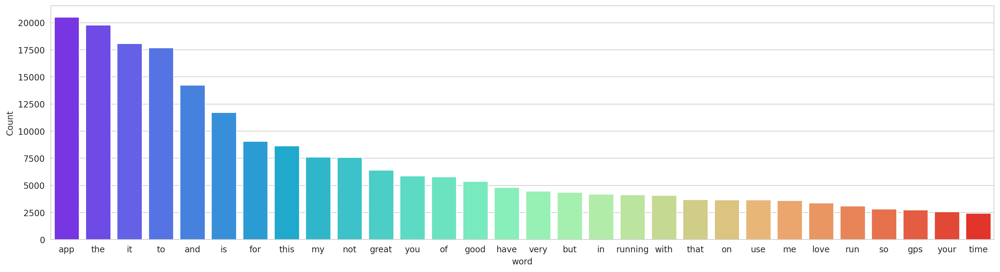

In [33]:
freq_words(df_adidasrev['cleaned_content'])

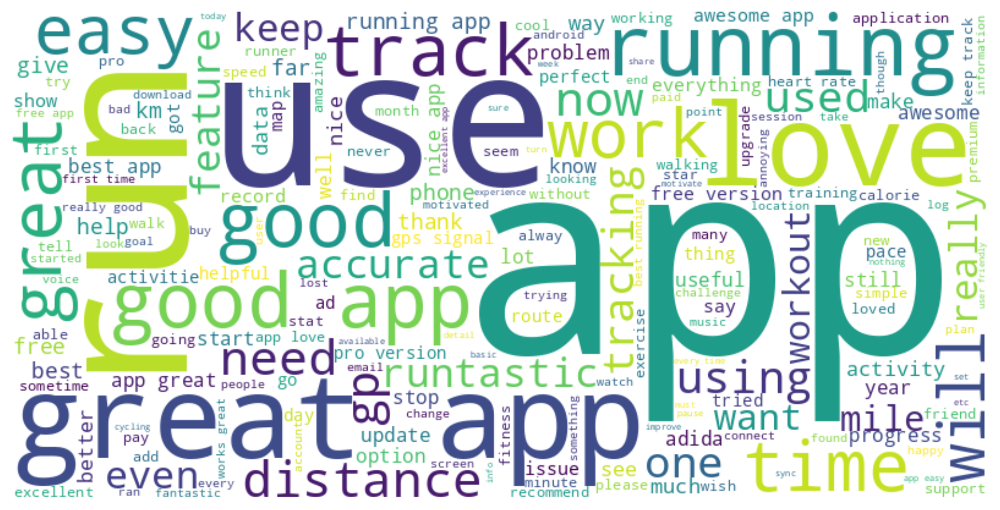

In [34]:
# Join all of the words in the 'content' in one string
all_words_before = ' '.join(df_adidasrev['cleaned_content'])

# WordCloud before removing stopwords
wordcloud_before = WordCloud(width=800, height=400, background_color='white').generate(all_words_before)
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_before, interpolation='bilinear')
plt.axis('off')
plt.show()

##**Stopword Removal**

In [35]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Ambil daftar stopwords bahasa Inggris
english_stopwords = set(stopwords.words('english'))  # Gunakan set untuk akses lebih cepat

# Tambahkan kata tambahan ke dalam stopwords
english_stopwords.update(['app', 'used'])  # update() lebih efisien dibanding extend()

# Terapkan stopword removal ke setiap list token
df_adidasrev["token_after_sr"] = df_adidasrev["token"].apply(lambda tokens: [word for word in tokens if isinstance(tokens, list) and word not in english_stopwords and word.isalpha()])

# Gabungkan token menjadi teks yang bersih dalam kolom cleaned_content
df_adidasrev["cleaned_content"] = df_adidasrev["token_after_sr"].apply(lambda tokens: ' '.join(tokens))

# Tampilkan hasil
display(df_adidasrev[['content', 'cleaned_content', 'token', 'token_after_sr']])


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,content,cleaned_content,token,token_after_sr
1,"i'm trying to pay for full access for a year, but it doesn't work",trying pay full access year work,"[am, trying, to, pay, for, full, access, for, year, but, it, does, not, work]","[trying, pay, full, access, year, work]"
2,great app,great,"[great, app]",[great]
3,genuinely good application to track your progress,genuinely good application track progress,"[genuinely, good, application, to, track, your, progress]","[genuinely, good, application, track, progress]"
5,"i enjoy hiking, and it's great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.",enjoy hiking great get free points turn coupons great brand garmin comparability makes even easier,"[enjoy, hiking, and, it, is, great, that, can, get, free, points, to, turn, in, coupons, for, great, brand, the, garmin, comparability, makes, it, even, easier]","[enjoy, hiking, great, get, free, points, turn, coupons, great, brand, garmin, comparability, makes, even, easier]"
6,too early yet,early yet,"[too, early, yet]","[early, yet]"
...,...,...,...,...
52909,works great on htc incredible,works great htc incredible,"[works, great, on, htc, incredible]","[works, great, htc, incredible]"
52910,force close never would open on my htc droid,force close never would open htc droid,"[force, close, never, would, open, on, my, htc, droid]","[force, close, never, would, open, htc, droid]"
52911,fc on hero,fc hero,"[fc, on, hero]","[fc, hero]"
52912,force closes at start up on motorola dext (cliq),force closes start motorola dext cliq,"[force, closes, at, start, up, on, motorola, dext, cliq]","[force, closes, start, motorola, dext, cliq]"


<ipython-input-32-b9ff2e5d559c>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette="rainbow")


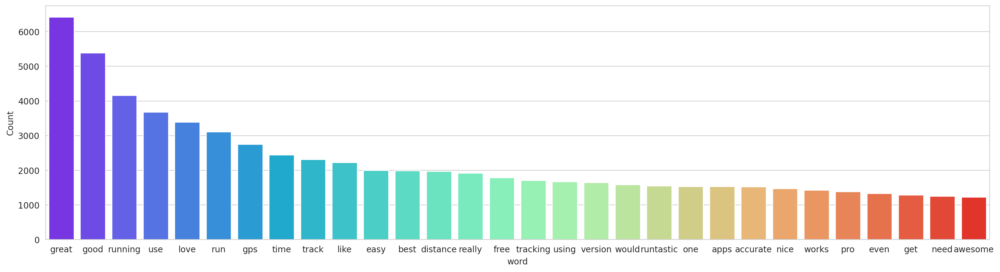

In [36]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_adidasrev['cleaned_content'])

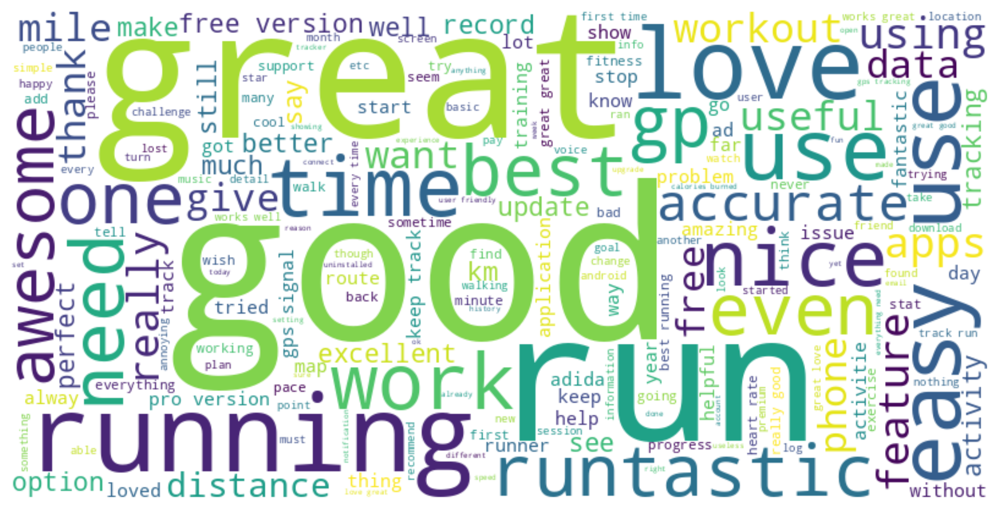

In [37]:
# WordCloud setelah menghapus stopwords
all_words_after = ' '.join(df_adidasrev['cleaned_content'])
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()

##**Stemming & Lemmatization**

In [38]:
import nltk
from nltk.stem import WordNetLemmatizer, PorterStemmer
nltk.download('wordnet')
nltk.download('omw-1.4')  # Tambahan untuk lemmatization yang lebih baik

# Inisialisasi lemmatizer dan stemmer
lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer()

# Fungsi untuk lemmatization dengan memastikan token adalah list
def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(word, pos='v') for word in tokens]

# Fungsi untuk stemming dengan memastikan token adalah list
def stem_tokens(tokens):
    return [stemmer.stem(word) for word in tokens]

# Terapkan lemmatization ke kolom token
df_adidasrev["token_after_lem"] = df_adidasrev["token_after_sr"].apply(lemmatize_tokens)

# Terapkan stemming ke kolom token
df_adidasrev["token_after_stem"] = df_adidasrev["token_after_sr"].apply(stem_tokens)

# Gabungkan kembali token setelah lemmatization menjadi satu string
df_adidasrev["cleaned_content"] = df_adidasrev["token_after_lem"].apply(lambda tokens: ' '.join(tokens) if isinstance(tokens, list) else tokens)

# Tampilkan hasil
df_adidasrev.head()



[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiment_polarity,sentiment_subjective,sentiment_rating,expanded_content,token,cleaned_content,token_after_sr,token_after_lem,token_after_stem
1,2,"i'm trying to pay for full access for a year, but it doesn't work",3,0,13.50,2025-04-02 19:49:14,13.50,0.35,0.55,Neutral,"i am trying to pay for full access for a year, but it does not work","[am, trying, to, pay, for, full, access, for, year, but, it, does, not, work]",try pay full access year work,"[trying, pay, full, access, year, work]","[try, pay, full, access, year, work]","[tri, pay, full, access, year, work]"
2,3,great app,4,0,5.5.4,2025-04-01 19:28:41,5.5.4,0.80,0.75,Positive,great app,"[great, app]",great,[great],[great],[great]
3,4,genuinely good application to track your progress,5,0,13.50,2025-04-01 14:05:06,13.50,0.70,0.60,Positive,genuinely good application to track your progress,"[genuinely, good, application, to, track, your, progress]",genuinely good application track progress,"[genuinely, good, application, track, progress]","[genuinely, good, application, track, progress]","[genuin, good, applic, track, progress]"
5,6,"i enjoy hiking, and it's great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.",5,0,13.50,2025-03-31 12:55:35,13.50,0.60,0.70,Positive,"i enjoy hiking, and it is great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.","[enjoy, hiking, and, it, is, great, that, can, get, free, points, to, turn, in, coupons, for, great, brand, the, garmin, comparability, makes, it, even, easier]",enjoy hike great get free point turn coupons great brand garmin comparability make even easier,"[enjoy, hiking, great, get, free, points, turn, coupons, great, brand, garmin, comparability, makes, even, easier]","[enjoy, hike, great, get, free, point, turn, coupons, great, brand, garmin, comparability, make, even, easier]","[enjoy, hike, great, get, free, point, turn, coupon, great, brand, garmin, compar, make, even, easier]"
6,7,too early yet,2,0,13.50,2025-03-31 10:36:08,13.50,0.10,0.30,Negative,too early yet,"[too, early, yet]",early yet,"[early, yet]","[early, yet]","[earli, yet]"


##**Rare Words Removal**

In [39]:
from nltk.probability import FreqDist

# Hitung frekuensi kata berdasarkan seluruh dataset
all_tokens = [word for tokens in df_adidasrev["token_after_lem"] for word in tokens]  # Gabungkan semua token
fdist = FreqDist(all_tokens)  # Hitung frekuensi global

# Tentukan kata yang jarang muncul berdasarkan threshold
threshold = 2
rare_words = set(word for word, freq in fdist.items() if freq <= threshold)

# Fungsi untuk menghapus kata langka berdasarkan frekuensi global
def rare_words_removal(tokens):
    return [word for word in tokens if word not in rare_words]

# Terapkan fungsi ini ke setiap baris di kolom 'token_after_lemm'
df_adidasrev['token_after_rwr'] = df_adidasrev['token_after_lem'].apply(rare_words_removal)

# Print kata-kata umum yang dihapus (untuk verifikasi)
print("Rare words removed:", list(rare_words))

# Tampilkan DataFrame untuk verifikasi
display(df_adidasrev)

Rare words removed: ['baffle', 'knowingly', 'wates', 'situacin', 'ish', 'plaster', 'dissent', 'vivosmart', 'woykd', 'unavialbe', 'shutdown', 'bikerun', 'timeout', 'jas', 'accelerometer', 'uou', 'behench', 'familiarization', 'msn', 'phezulu', 'prison', 'afer', 'runswalkshikes', 'empty', 'businesses', 'socail', 'timesthis', 'switchday', 'tactic', 'discovery', 'mzan', 'ali', 'mja', 'dowlod', 'matram', 'awesomei', 'fever', 'mitre', 'avialable', 'ttack', 'override', 'slounder', 'webui', 'wisdom', 'inte', 'expetation', 'continuation', 'relaunching', 'upd', 'gpswise', 'enrich', 'ge', 'greengood', 'sedentary', 'urs', 'facts', 'innovate', 'invisible', 'timerprompt', 'dosnt', 'maker', 'justice', 'ossum', 'dddff', 'beze', 'notapennymore', 'teleport', 'seeet', 'lowest', 'doable', 'hugely', 'gjb', 'explorer', 'consequently', 'exersing', 'importat', 'routinely', 'incentivives', 'runt', 'acutally', 'dony', 'honesty', 'joggin', 'childhood', 'torture', 'simpleuse', 'untrue', 'zhe', 'perfer', 'walktasti

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiment_polarity,sentiment_subjective,sentiment_rating,expanded_content,token,cleaned_content,token_after_sr,token_after_lem,token_after_stem,token_after_rwr
1,2,"i'm trying to pay for full access for a year, but it doesn't work",3,0,13.50,2025-04-02 19:49:14,13.50,0.35,0.550,Neutral,"i am trying to pay for full access for a year, but it does not work","[am, trying, to, pay, for, full, access, for, year, but, it, does, not, work]",try pay full access year work,"[trying, pay, full, access, year, work]","[try, pay, full, access, year, work]","[tri, pay, full, access, year, work]","[try, pay, full, access, year, work]"
2,3,great app,4,0,5.5.4,2025-04-01 19:28:41,5.5.4,0.80,0.750,Positive,great app,"[great, app]",great,[great],[great],[great],[great]
3,4,genuinely good application to track your progress,5,0,13.50,2025-04-01 14:05:06,13.50,0.70,0.600,Positive,genuinely good application to track your progress,"[genuinely, good, application, to, track, your, progress]",genuinely good application track progress,"[genuinely, good, application, track, progress]","[genuinely, good, application, track, progress]","[genuin, good, applic, track, progress]","[genuinely, good, application, track, progress]"
5,6,"i enjoy hiking, and it's great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.",5,0,13.50,2025-03-31 12:55:35,13.50,0.60,0.700,Positive,"i enjoy hiking, and it is great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.","[enjoy, hiking, and, it, is, great, that, can, get, free, points, to, turn, in, coupons, for, great, brand, the, garmin, comparability, makes, it, even, easier]",enjoy hike great get free point turn coupons great brand garmin comparability make even easier,"[enjoy, hiking, great, get, free, points, turn, coupons, great, brand, garmin, comparability, makes, even, easier]","[enjoy, hike, great, get, free, point, turn, coupons, great, brand, garmin, comparability, make, even, easier]","[enjoy, hike, great, get, free, point, turn, coupon, great, brand, garmin, compar, make, even, easier]","[enjoy, hike, great, get, free, point, turn, great, brand, garmin, make, even, easier]"
6,7,too early yet,2,0,13.50,2025-03-31 10:36:08,13.50,0.10,0.300,Negative,too early yet,"[too, early, yet]",early yet,"[early, yet]","[early, yet]","[earli, yet]","[early, yet]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52909,52910,works great on htc incredible,5,1,1.0,2010-05-14 23:11:53,1.0,0.85,0.825,Positive,works great on htc incredible,"[works, great, on, htc, incredible]",work great htc incredible,"[works, great, htc, incredible]","[work, great, htc, incredible]","[work, great, htc, incred]","[work, great, htc, incredible]"
52910,52911,force close never would open on my htc droid,1,1,1.0,2010-05-14 19:32:44,1.0,0.00,0.500,Negative,force close never would open on my htc droid,"[force, close, never, would, open, on, my, htc, droid]",force close never would open htc droid,"[force, close, never, would, open, htc, droid]","[force, close, never, would, open, htc, droid]","[forc, close, never, would, open, htc, droid]","[force, close, never, would, open, htc, droid]"
52911,52912,fc on hero,1,0,1.0,2010-05-13 12:13:36,1.0,0.00,0.000,Negative,fc on hero,"[fc, on, hero]",fc hero,"[fc, hero]","[fc, hero]","[fc, hero]",[hero]
52912,52913,force closes at start up on motorola dext (cliq),1,1,1.0,2010-05-13 06:13:33,1.0,0.00,0.000,Negative,force closes at start up on motorola dext (cliq),"[force, closes, at, start, up, on, motorola, dext, cliq]",force close start motorola dext cliq,"[force, closes, start, motorola, dext, cliq]","[force, close, start, motorola, dext, cliq]","[forc, close, start, motorola, dext, cliq]","[force, close, start, motorola]"


##**Common Words Removal**

In [40]:
from nltk.probability import FreqDist

# Hitung threshold secara fleksibel
threshold = max(10, int(len(df_adidasrev) * 0.05))

# Hitung frekuensi kata SEKALI SAJA untuk semua data
all_tokens = [word for sublist in df_adidasrev["token_after_rwr"] for word in sublist]
fdist = FreqDist(all_tokens)

# Tentukan kata-kata umum yang akan dihapus
common_words = set(word for word, freq in fdist.items() if freq >= threshold)

def common_words_removal(tokens):
    filtered_tokens = [word for word in tokens if word not in common_words]
    return filtered_tokens if filtered_tokens else ["EMPTY"]  # Hindari baris kosong

# Terapkan common words removal ke seluruh kolom (lebih cepat)
df_adidasrev['token_after_cwr'] = df_adidasrev['token_after_rwr'].apply(common_words_removal)

# Print kata-kata umum yang dihapus (untuk verifikasi)
print("Common words removed:", list(common_words))

# Tampilkan 5 baris pertama DataFrame
df_adidasrev.head()

Common words removed: ['great', 'work', 'really', 'track', 'love', 'like', 'keep', 'easy', 'best', 'good', 'run', 'time', 'get', 'use', 'distance', 'gps']


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiment_polarity,sentiment_subjective,sentiment_rating,expanded_content,token,cleaned_content,token_after_sr,token_after_lem,token_after_stem,token_after_rwr,token_after_cwr
1,2,"i'm trying to pay for full access for a year, but it doesn't work",3,0,13.50,2025-04-02 19:49:14,13.50,0.35,0.55,Neutral,"i am trying to pay for full access for a year, but it does not work","[am, trying, to, pay, for, full, access, for, year, but, it, does, not, work]",try pay full access year work,"[trying, pay, full, access, year, work]","[try, pay, full, access, year, work]","[tri, pay, full, access, year, work]","[try, pay, full, access, year, work]","[try, pay, full, access, year]"
2,3,great app,4,0,5.5.4,2025-04-01 19:28:41,5.5.4,0.80,0.75,Positive,great app,"[great, app]",great,[great],[great],[great],[great],[EMPTY]
3,4,genuinely good application to track your progress,5,0,13.50,2025-04-01 14:05:06,13.50,0.70,0.60,Positive,genuinely good application to track your progress,"[genuinely, good, application, to, track, your, progress]",genuinely good application track progress,"[genuinely, good, application, track, progress]","[genuinely, good, application, track, progress]","[genuin, good, applic, track, progress]","[genuinely, good, application, track, progress]","[genuinely, application, progress]"
5,6,"i enjoy hiking, and it's great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.",5,0,13.50,2025-03-31 12:55:35,13.50,0.60,0.70,Positive,"i enjoy hiking, and it is great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.","[enjoy, hiking, and, it, is, great, that, can, get, free, points, to, turn, in, coupons, for, great, brand, the, garmin, comparability, makes, it, even, easier]",enjoy hike great get free point turn coupons great brand garmin comparability make even easier,"[enjoy, hiking, great, get, free, points, turn, coupons, great, brand, garmin, comparability, makes, even, easier]","[enjoy, hike, great, get, free, point, turn, coupons, great, brand, garmin, comparability, make, even, easier]","[enjoy, hike, great, get, free, point, turn, coupon, great, brand, garmin, compar, make, even, easier]","[enjoy, hike, great, get, free, point, turn, great, brand, garmin, make, even, easier]","[enjoy, hike, free, point, turn, brand, garmin, make, even, easier]"
6,7,too early yet,2,0,13.50,2025-03-31 10:36:08,13.50,0.10,0.30,Negative,too early yet,"[too, early, yet]",early yet,"[early, yet]","[early, yet]","[earli, yet]","[early, yet]","[early, yet]"


#**Sentiment Analysis After Preprocessing**

In [41]:
# Pastikan cleaned_content tidak ada nilai NaN
df_adidasrev['cleaned_content'] = df_adidasrev['cleaned_content'].fillna('')

# Hitung sentiment polarity dan subjectivity
df_adidasrev['sentiment_polarity'] = df_adidasrev['cleaned_content'].apply(lambda x: TextBlob(x).polarity)
df_adidasrev['sentiment_subjective'] = df_adidasrev['cleaned_content'].apply(lambda x: TextBlob(x).subjectivity)

# Tampilkan hasil
df_adidasrev.head()

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,sentiment_polarity,sentiment_subjective,sentiment_rating,expanded_content,token,cleaned_content,token_after_sr,token_after_lem,token_after_stem,token_after_rwr,token_after_cwr
1,2,"i'm trying to pay for full access for a year, but it doesn't work",3,0,13.50,2025-04-02 19:49:14,13.50,0.35,0.55,Neutral,"i am trying to pay for full access for a year, but it does not work","[am, trying, to, pay, for, full, access, for, year, but, it, does, not, work]",try pay full access year work,"[trying, pay, full, access, year, work]","[try, pay, full, access, year, work]","[tri, pay, full, access, year, work]","[try, pay, full, access, year, work]","[try, pay, full, access, year]"
2,3,great app,4,0,5.5.4,2025-04-01 19:28:41,5.5.4,0.80,0.75,Positive,great app,"[great, app]",great,[great],[great],[great],[great],[EMPTY]
3,4,genuinely good application to track your progress,5,0,13.50,2025-04-01 14:05:06,13.50,0.70,0.60,Positive,genuinely good application to track your progress,"[genuinely, good, application, to, track, your, progress]",genuinely good application track progress,"[genuinely, good, application, track, progress]","[genuinely, good, application, track, progress]","[genuin, good, applic, track, progress]","[genuinely, good, application, track, progress]","[genuinely, application, progress]"
5,6,"i enjoy hiking, and it's great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.",5,0,13.50,2025-03-31 12:55:35,13.50,0.60,0.70,Positive,"i enjoy hiking, and it is great that i can get free points to turn in coupons for a great brand. the garmin comparability makes it even easier.","[enjoy, hiking, and, it, is, great, that, can, get, free, points, to, turn, in, coupons, for, great, brand, the, garmin, comparability, makes, it, even, easier]",enjoy hike great get free point turn coupons great brand garmin comparability make even easier,"[enjoy, hiking, great, get, free, points, turn, coupons, great, brand, garmin, comparability, makes, even, easier]","[enjoy, hike, great, get, free, point, turn, coupons, great, brand, garmin, comparability, make, even, easier]","[enjoy, hike, great, get, free, point, turn, coupon, great, brand, garmin, compar, make, even, easier]","[enjoy, hike, great, get, free, point, turn, great, brand, garmin, make, even, easier]","[enjoy, hike, free, point, turn, brand, garmin, make, even, easier]"
6,7,too early yet,2,0,13.50,2025-03-31 10:36:08,13.50,0.10,0.30,Negative,too early yet,"[too, early, yet]",early yet,"[early, yet]","[early, yet]","[earli, yet]","[early, yet]","[early, yet]"


In [42]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_adidasrev['sentiment_rating'] = df_adidasrev['score'].apply(lambda x: 'Positive' if x > 3 else ('Neutral' if x == 3 else 'Negative'))

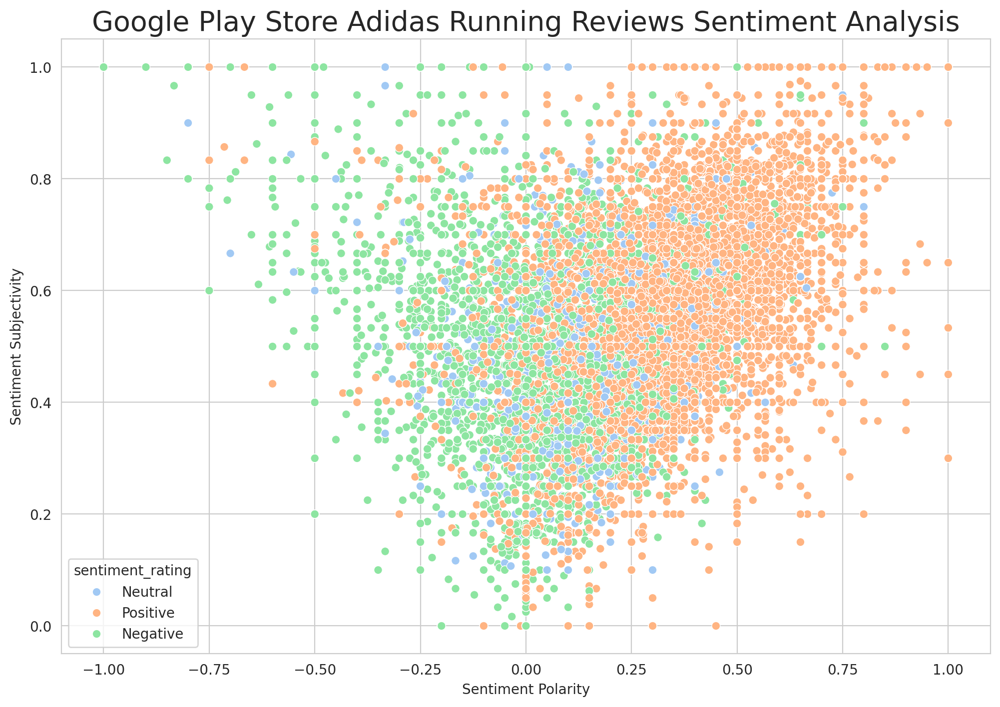

In [43]:

# Scatter plot untuk sentiment polarity vs sentiment subjectivity
sns.scatterplot(
    x=df_adidasrev['sentiment_polarity'],
    y=df_adidasrev['sentiment_subjective'],
    hue=df_adidasrev['sentiment_rating'],  # Warna berdasarkan sentimen (Positive, Neutral, Negative)
    edgecolor='white',
    palette="pastel"
)

plt.title("Google Play Store Adidas Running Reviews Sentiment Analysis", fontsize=20)
plt.xlabel("Sentiment Polarity")
plt.ylabel("Sentiment Subjectivity")
plt.show()

<ipython-input-32-b9ff2e5d559c>:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette="rainbow")


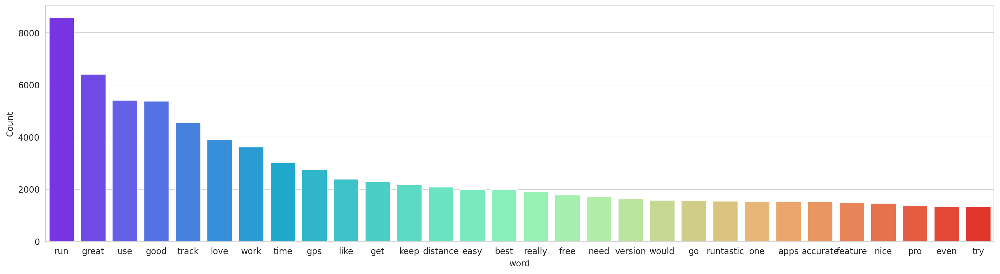

In [44]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_adidasrev['cleaned_content'])

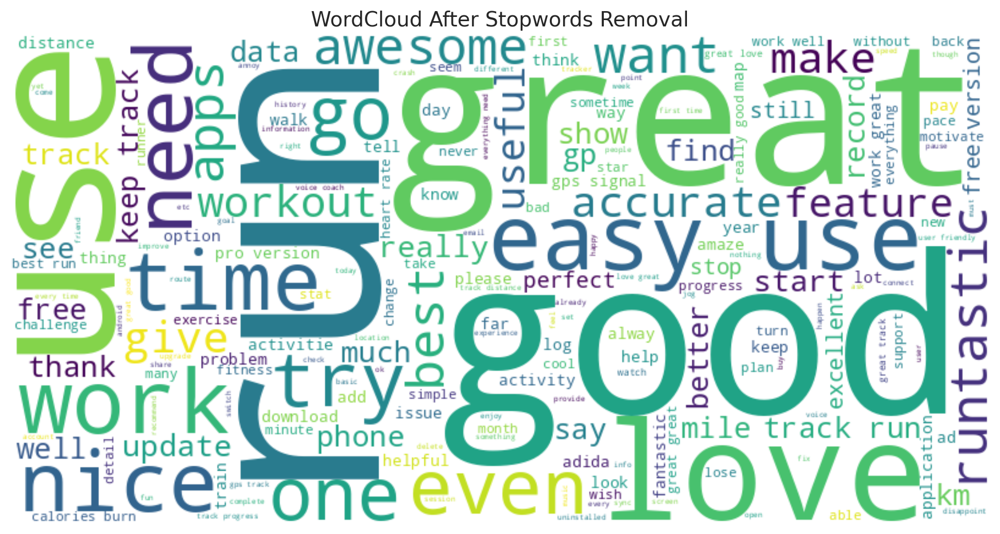

In [45]:
# Gabungkan semua kata setelah pembersihan stopwords
all_words_after = ' '.join(df_adidasrev['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Plot WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.title("WordCloud After Stopwords Removal", fontsize=14)
plt.show()

In [46]:
from collections import Counter
import pandas as pd

def freq_words_top5(text_column, n=5):
    """
    Menghitung n kata paling sering muncul dalam kolom teks.

    Parameters:
        text_column (pd.Series): Kolom teks dalam DataFrame.
        n (int): Jumlah kata teratas yang ingin ditampilkan (default = 5).

    Returns:
        pd.DataFrame: DataFrame dengan kata dan jumlah kemunculannya.
    """
    # Pastikan kolom tidak kosong atau berisi NaN
    text_column = text_column.dropna()

    # Gabungkan semua teks menjadi satu string
    all_words = ' '.join(text_column).split()

    # Hitung jumlah kemunculan setiap kata
    word_counts = Counter(all_words)

    # Konversi ke DataFrame
    words_df = pd.DataFrame({'word': list(word_counts.keys()), 'count': list(word_counts.values())})

    # Ambil n kata dengan frekuensi tertinggi
    top_words = words_df.nlargest(columns="count", n=n)

    return top_words

# Terapkan fungsi pada DataFrame df_adidasrev
top_5_words = freq_words_top5(df_adidasrev['cleaned_content'], n=5)
print(top_5_words)

     word  count
33    run   8598
6   great   6421
28    use   5424
8    good   5386
10  track   4561


In [47]:
df_adidasrev['score'].value_counts()

,count
score,
5,22698
4,5738
1,4771
3,2049
2,1909


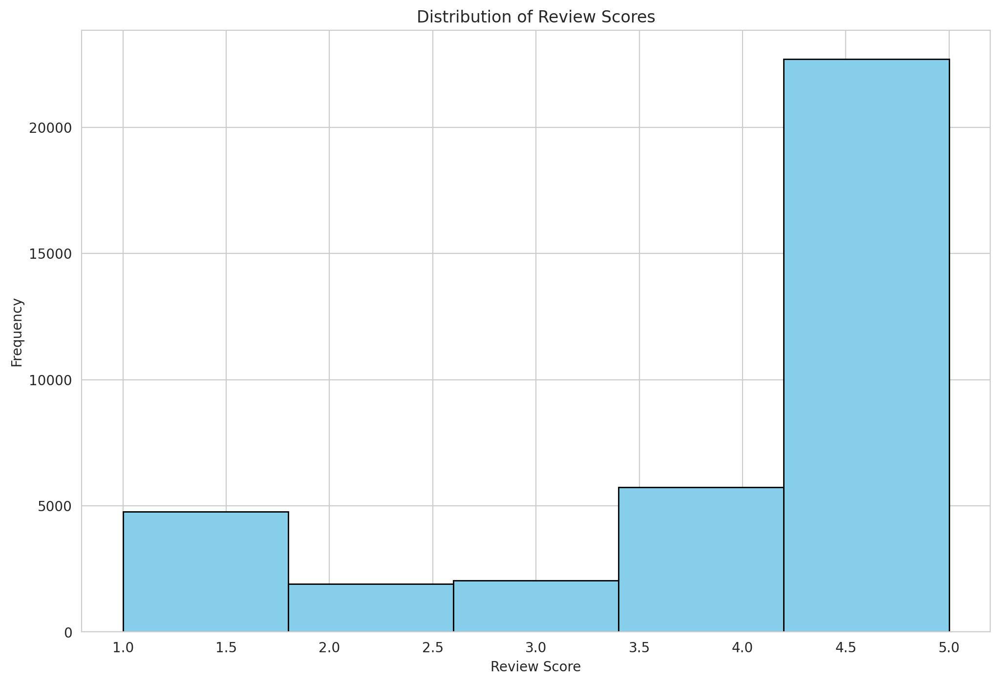

In [48]:
import matplotlib.pyplot as plt

plt.hist(df_adidasrev['score'], bins=5, color='skyblue', edgecolor='black')
plt.xlabel('Review Score')
plt.ylabel('Frequency')
plt.title('Distribution of Review Scores')
plt.show()

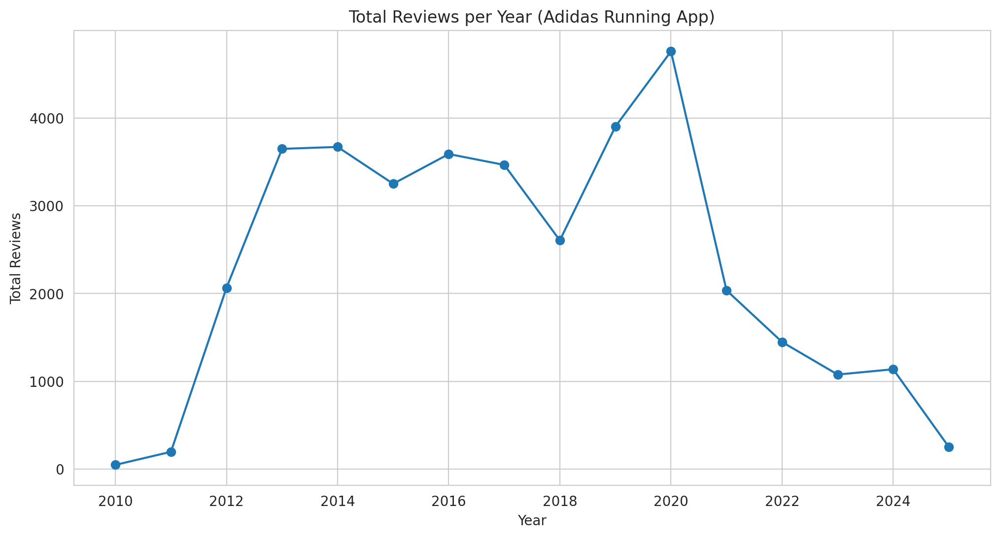

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Konversi kolom 'at' ke format datetime jika belum dalam bentuk datetime
df_adidasrev['at'] = pd.to_datetime(df_adidasrev['at'], errors='coerce')

# Ekstrak tahun dan bulan dari kolom 'at'
df_adidasrev['year'] = df_adidasrev['at'].dt.year
df_adidasrev['month'] = df_adidasrev['at'].dt.month

# Hitung jumlah ulasan per tahun
yearly_reviews = df_adidasrev.groupby('year')['id'].count()

# Hitung jumlah ulasan per tahun dan bulan
monthly_reviews = df_adidasrev.groupby(['year', 'month'])['id'].count()

# Plot jumlah ulasan per tahun
plt.figure(figsize=(12, 6))
plt.plot(yearly_reviews.index, yearly_reviews.values, marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Year (Adidas Running App)')
plt.grid(True)
plt.show()

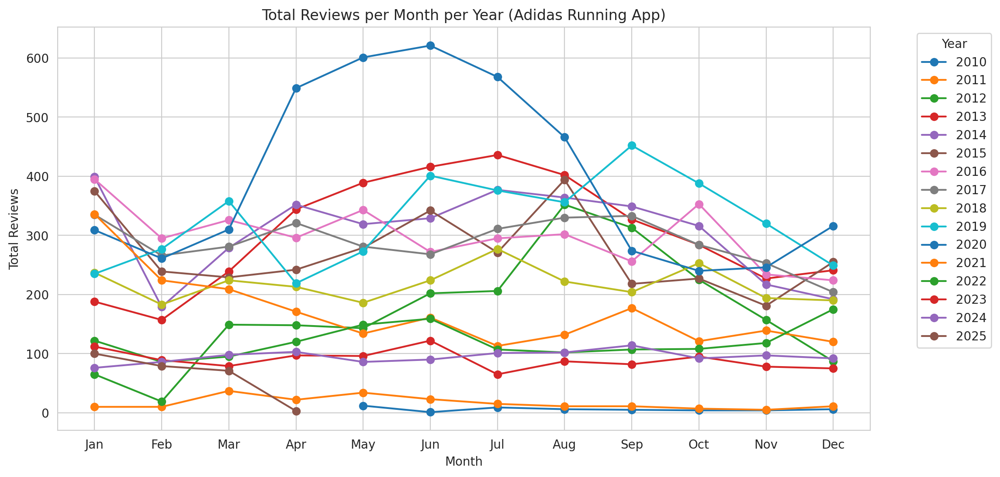

In [50]:
# Membuat line chart untuk total ulasan per bulan per tahun
plt.figure(figsize=(12, 6))

# Loop untuk setiap tahun yang ada dalam dataset
for year in monthly_reviews.index.get_level_values(0).unique():
    year_data = monthly_reviews.loc[year]  # Ambil data berdasarkan tahun
    plt.plot(year_data.index, year_data.values, marker='o', label=str(year))

plt.xlabel('Month')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Month per Year (Adidas Running App)')
plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left')  # Tambahkan legenda di sebelah kanan
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])  # Label bulan
plt.grid(True)
plt.show()

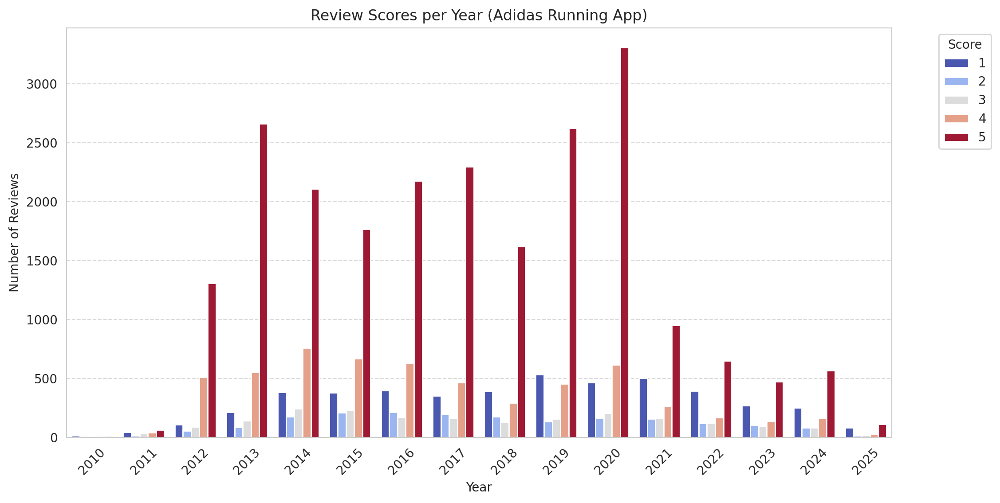

score,1,2,3,4,5
year,,,,,
2010,15,10,3,9,10
2011,45,14,34,39,64
2012,106,54,90,509,1307
2013,212,84,142,551,2661
2014,383,177,245,758,2109
2015,377,208,231,668,1768
2016,399,214,173,629,2176
2017,351,195,161,464,2296
2018,388,176,130,291,1622


In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan kolom 'at' dalam format datetime
df_adidasrev['at'] = pd.to_datetime(df_adidasrev['at'])

# Ekstrak tahun dari kolom 'at'
df_adidasrev['year'] = df_adidasrev['at'].dt.year

# Kelompokkan data berdasarkan tahun dan score, lalu hitung jumlahnya
score_per_year = df_adidasrev.groupby(['year', 'score'])['id'].count().reset_index()

# Buat bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='year', y='id', hue='score', data=score_per_year, palette="coolwarm")

# Kustomisasi tampilan grafik
plt.xlabel('Year')
plt.ylabel('Number of Reviews')
plt.title('Review Scores per Year (Adidas Running App)')
plt.legend(title='Score', bbox_to_anchor=(1.05, 1), loc='upper left')  # Letakkan legenda di samping kanan
plt.xticks(rotation=45)  # Rotasi label tahun agar lebih mudah dibaca
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Tambahkan grid horizontal
plt.show()

# DataFrame untuk melihat distribusi score per tahun dalam tabel
score_per_year_df = df_adidasrev.groupby('year')['score'].value_counts().unstack(fill_value=0)
score_per_year_df

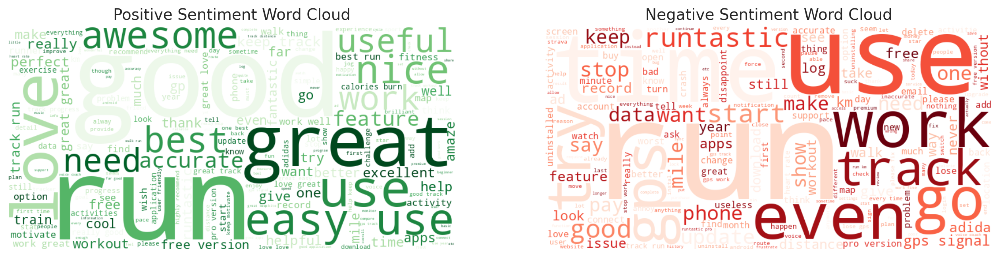

In [52]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Memisahkan ulasan positif dan negatif berdasarkan sentiment_rating
positive_reviews = df_adidasrev[df_adidasrev['sentiment_rating'] == 'Positive']['cleaned_content']
negative_reviews = df_adidasrev[df_adidasrev['sentiment_rating'] == 'Negative']['cleaned_content']

# Menggabungkan teks untuk setiap kategori
positive_text = ' '.join(positive_reviews.dropna())  # Drop NaN untuk menghindari error
negative_text = ' '.join(negative_reviews.dropna())

# Membuat wordcloud untuk masing-masing sentimen
positive_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Greens').generate(positive_text)
negative_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Reds').generate(negative_text)

# Menampilkan wordcloud
plt.figure(figsize=(16, 8))

# Wordcloud Sentimen Positif
plt.subplot(1, 2, 1)
plt.imshow(positive_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Positive Sentiment Word Cloud", fontsize=14)

# Wordcloud Sentimen Negatif
plt.subplot(1, 2, 2)
plt.imshow(negative_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Negative Sentiment Word Cloud", fontsize=14)

plt.show()

In [53]:
df_adidasrev.to_csv('df_adidasrev_preprocessed.csv', index=False)